# Import Libraries

In [1]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
from swarmintelligence import Utilization
from scipy.stats import wilcoxon
import cv2
from sewar.full_ref import *

# Load Experiments Results

In [2]:
# key inner join later
on=['image_name', 'thresholds']

## Single Method

In [3]:
# group each results by SI Methods
pso_otsu_results = pickle.load(open('results/evaluation/PSO/PSO_otsu_df.pkl', 'rb'))
ga_otsu_results = pickle.load(open('results/evaluation/GA/GA_otsu_df.pkl', 'rb'))
woa_otsu_results = pickle.load(open('results/evaluation/WOA/WOA_otsu_df.pkl', 'rb'))
gwo_otsu_results = pickle.load(open('results/evaluation/GWO/GWO_otsu_df.pkl', 'rb'))
sma_otsu_results = pickle.load(open('results/evaluation/SMA/SMA_otsu_df.pkl', 'rb'))
mem_gwo_otsu_results = pickle.load(open('results/evaluation/memGWO/memGWO_otsu_df.pkl', 'rb'))

In [4]:
mem_gwo_otsu_results.head()

,image_name,thresholds,fitness_function,obj,Mean best_thresholds,Mean CPU_time (seconds),Mean Fitness,Mean MSE,Mean RMSE,Mean PSNR,Mean SSIM,Mean UQI,Regions,CPU_time (seconds),Fitness,MSE,RMSE,PSNR,SSIM,UQI
0,AirplaneF16.tiff,2,otsu,max,"[113, 173]",1.129657,1948.718131,2270.227447,47.646898,14.570112,0.794424,0.940226,"[[113, 255, 255, 255, 255, 255, 255, 255, 255,...","[1.218674659729004, 1.0475709438323975, 0.9943...","[1948.7183902321062, 1948.7183902321062, 1948....","[2270.6405181884766, 2270.6405181884766, 2270....","[47.651238369936166, 47.651238369936166, 47.65...","[14.569319775617668, 14.569319775617668, 14.56...","[0.7944112258870609, 0.7944112258870609, 0.794...","[0.9402201034707982, 0.9402201034707982, 0.940..."
1,AirplaneF16.tiff,3,otsu,max,"[93, 145, 191]",1.110021,2024.827766,1773.460517,42.112208,15.642698,0.779065,0.953245,"[[93, 255, 255, 191, 191, 191, 255, 191, 255, ...","[1.1750526428222656, 1.128763198852539, 0.9727...","[2024.8375098105803, 2024.8375098105803, 2024....","[1774.3395538330078, 1774.3395538330078, 1774....","[42.12291008267363, 42.12291008267363, 42.1229...","[15.640436268576428, 15.640436268576428, 15.64...","[0.77934507049225, 0.77934507049225, 0.7793450...","[0.9532349424759257, 0.9532349424759257, 0.953..."
2,AirplaneF16.tiff,4,otsu,max,"[84, 129, 172, 203]",0.999825,2069.976436,1100.239374,33.168823,17.716469,0.732559,0.969284,"[[84, 203, 203, 203, 203, 203, 203, 203, 203, ...","[1.2383270263671875, 1.0900850296020508, 0.883...","[2069.932857317965, 2070.0794736113085, 2069.8...","[1091.6536865234375, 1094.045597076416, 1093.1...","[33.04018290693073, 33.07636009412789, 33.0624...","[17.74995475141993, 17.74044938188586, 17.7441...","[0.7321918575892461, 0.7326687134455045, 0.731...","[0.9696552295343954, 0.9693723689797689, 0.969..."
3,AirplaneF16.tiff,5,otsu,max,"[71, 108, 144, 180, 205]",0.838734,2095.894101,904.497442,30.074350,18.567030,0.745396,0.975408,"[[71, 205, 205, 205, 180, 205, 205, 205, 205, ...","[0.9278750419616699, 0.9405975341796875, 1.074...","[2096.0857299534687, 2096.1432770275533, 2096....","[906.4246559143066, 907.2876815795898, 905.764...","[30.106887184069805, 30.121216469120064, 30.09...","[18.55748650484443, 18.55335346450818, 18.5606...","[0.7450408811064716, 0.7452811482856196, 0.745...","[0.9753449854423007, 0.9753724479476479, 0.975..."
4,Lena.png,2,otsu,max,"[93, 151]",0.763458,1961.822013,2813.567070,53.043068,13.638231,0.612182,0.883309,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...","[0.6224963665008545, 0.9671077728271484, 0.726...","[1961.8220125153634, 1961.8220125153634, 1961....","[2813.567070007324, 2813.567070007324, 2813.56...","[53.04306806744237, 53.04306806744237, 53.0430...","[13.638230885124642, 13.638230885124642, 13.63...","[0.6121817460412936, 0.6121817460412936, 0.612...","[0.8833090574580458, 0.8833090574580458, 0.883..."


### Grouping by Metrics Evaluation

In [5]:
### ========== PSNR
ga_psnr = ga_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
pso_psnr = pso_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
woa_psnr = woa_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
gwo_psnr = gwo_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
sma_psnr = sma_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
mem_gwo_psnr = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()


ga_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GA', 'PSNR': 'PSNR GA'}, inplace=True)
pso_psnr.rename(columns={'Mean PSNR': 'Mean PSNR PSO','PSNR': 'PSNR PSO'}, inplace=True)
woa_psnr.rename(columns={'Mean PSNR': 'Mean PSNR WOA','PSNR': 'PSNR WOA'}, inplace=True)
gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GWO','PSNR': 'PSNR GWO'}, inplace=True)
sma_psnr.rename(columns={'Mean PSNR': 'Mean PSNR SMA', 'PSNR': 'PSNR SMA'}, inplace=True)
mem_gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR MemoryGWO','PSNR': 'PSNR MemoryGWO'}, inplace=True)


### ======== RMSE
ga_rmse = ga_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
pso_rmse = pso_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
woa_rmse = woa_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
gwo_rmse = gwo_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
sma_rmse = sma_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
mem_gwo_rmse = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()


ga_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GA', 'RMSE': 'RMSE GA'}, inplace=True)
pso_rmse.rename(columns={'Mean RMSE': 'Mean RMSE PSO','RMSE': 'RMSE PSO'}, inplace=True)
woa_rmse.rename(columns={'Mean RMSE': 'Mean RMSE WOA','RMSE': 'RMSE WOA'}, inplace=True)
gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GWO','RMSE': 'RMSE GWO'}, inplace=True)
sma_rmse.rename(columns={'Mean RMSE': 'Mean RMSE SMA', 'RMSE': 'RMSE SMA'}, inplace=True)
mem_gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE MemoryGWO','RMSE': 'RMSE MemoryGWO'}, inplace=True)


### ======== SSIM
ga_ssim = ga_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
pso_ssim = pso_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
woa_ssim = woa_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
gwo_ssim = gwo_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
sma_ssim = sma_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
mem_gwo_ssim = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()


ga_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GA', 'SSIM': 'SSIM GA'}, inplace=True)
pso_ssim.rename(columns={'Mean SSIM': 'Mean SSIM PSO','SSIM': 'SSIM PSO'}, inplace=True)
woa_ssim.rename(columns={'Mean SSIM': 'Mean SSIM WOA','SSIM': 'SSIM WOA'}, inplace=True)
gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GWO','SSIM': 'SSIM GWO'}, inplace=True)
sma_ssim.rename(columns={'Mean SSIM': 'Mean SSIM SMA', 'SSIM': 'SSIM SMA'}, inplace=True)
mem_gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM MemoryGWO','SSIM': 'SSIM MemoryGWO'}, inplace=True)


### ======== UQI
ga_uqi = ga_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
pso_uqi = pso_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
woa_uqi = woa_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
gwo_uqi = gwo_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
sma_uqi = sma_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
mem_gwo_uqi = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()


ga_uqi.rename(columns={'Mean UQI': 'Mean UQI GA', 'UQI': 'UQI GA'}, inplace=True)
pso_uqi.rename(columns={'Mean UQI': 'Mean UQI PSO','UQI': 'UQI PSO'}, inplace=True)
woa_uqi.rename(columns={'Mean UQI': 'Mean UQI WOA','UQI': 'UQI WOA'}, inplace=True)
gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI GWO','UQI': 'UQI GWO'}, inplace=True)
sma_uqi.rename(columns={'Mean UQI': 'Mean UQI SMA', 'UQI': 'UQI SMA'}, inplace=True)
mem_gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI MemoryGWO','UQI': 'UQI MemoryGWO'}, inplace=True)



### ======== Fitness Value
ga_fitness = ga_otsu_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
pso_fitness = pso_otsu_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
woa_fitness = woa_otsu_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
gwo_fitness = gwo_otsu_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
sma_fitness = sma_otsu_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
mem_gwo_fitness= mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()


ga_fitness.rename(columns={'Mean Fitness': 'Mean Fitness GA', 'Fitness': 'Fitness GA'}, inplace=True)
pso_fitness.rename(columns={'Mean Fitness': 'Mean Fitness PSO','Fitness': 'Fitness PSO'}, inplace=True)
woa_fitness.rename(columns={'Mean Fitness': 'Mean Fitness WOA','Fitness': 'Fitness WOA'}, inplace=True)
gwo_fitness.rename(columns={'Mean Fitness': 'Mean Fitness GWO','Fitness': 'Fitness GWO'}, inplace=True)
sma_fitness.rename(columns={'Mean Fitness': 'Mean Fitness SMA', 'Fitness': 'Fitness SMA'}, inplace=True)
mem_gwo_fitness.rename(columns={'Mean Fitness': 'Mean Fitness MemoryGWO','Fitness': 'Fitness MemoryGWO'}, inplace=True)


### ======== CPU Time
ga_cpu_time = ga_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
pso_cpu_time = pso_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
woa_cpu_time = woa_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
gwo_cpu_time = gwo_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
sma_cpu_time = sma_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
mem_gwo_cpu_time = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()


ga_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GA', 'CPU_time (seconds)': 'CPU_time (seconds) GA'}, inplace=True)
pso_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) PSO','CPU_time (seconds)': 'CPU_time (seconds) PSO'}, inplace=True)
woa_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) WOA','CPU_time (seconds)': 'CPU_time (seconds) WOA'}, inplace=True)
gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GWO','CPU_time (seconds)': 'CPU_time (seconds) GWO'}, inplace=True)
sma_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) SMA', 'CPU_time (seconds)': 'CPU_time (seconds) SMA'}, inplace=True)
mem_gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) MemoryGWO','CPU_time (seconds)': 'CPU_time (seconds) MemoryGWO'}, inplace=True)


### ========== Best Threshold
ga_threshold = ga_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
pso_threshold = pso_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
woa_threshold = woa_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
gwo_threshold = gwo_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
sma_threshold = sma_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
mem_gwo_threshold = mem_gwo_otsu_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()


ga_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds GA'}, inplace=True)
pso_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds PSO'}, inplace=True)
woa_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds WOA'}, inplace=True)
gwo_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds GWO'}, inplace=True)
sma_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds SMA'}, inplace=True)
mem_gwo_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds MemoryGWO'}, inplace=True)

### Merge Results

In [6]:
### ======== PSNR
psnr_merge = ga_psnr.merge(pso_psnr, on=on).merge(woa_psnr, on=on).merge(gwo_psnr, on=on).merge(sma_psnr, on=on).merge(mem_gwo_psnr, on=on)
psnr_merge = psnr_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== RMSE
rmse_merge = ga_rmse.merge(pso_rmse, on=on).merge(woa_rmse, on=on).merge(gwo_rmse, on=on).merge(sma_rmse, on=on).merge(mem_gwo_rmse, on=on)
rmse_merge = rmse_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== SSIM
ssim_merge = ga_ssim.merge(pso_ssim, on=on).merge(woa_ssim, on=on).merge(gwo_ssim, on=on).merge(sma_ssim, on=on).merge(mem_gwo_ssim, on=on)
ssim_merge = ssim_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== UQI
uqi_merge = ga_uqi.merge(pso_uqi, on=on).merge(woa_uqi, on=on).merge(gwo_uqi, on=on).merge(sma_uqi, on=on).merge(mem_gwo_uqi, on=on)
uqi_merge = uqi_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Fitness Value
fitness_merge = ga_fitness.merge(pso_fitness, on=on).merge(woa_fitness, on=on).merge(gwo_fitness, on=on).merge(sma_fitness, on=on).merge(mem_gwo_fitness, on=on)
fitness_merge = fitness_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== CPU Time
cpu_time_merge = ga_cpu_time.merge(pso_cpu_time, on=on).merge(woa_cpu_time, on=on).merge(gwo_cpu_time, on=on).merge(sma_cpu_time, on=on).merge(mem_gwo_cpu_time, on=on)
cpu_time_merge = cpu_time_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])


### ======== Best Threshold
threshold_merge = ga_threshold.merge(pso_threshold, on=on).merge(woa_threshold, on=on).merge(gwo_threshold, on=on).merge(sma_threshold, on=on).merge(mem_gwo_threshold, on=on)
threshold_merge = threshold_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### Find Best value in each metrics

In [7]:
algorithms = ['PSO', 'GA', 'WOA', 'GWO', 'SMA', 'MemoryGWO']

def findMaximumMetrics(list_of_values):
    return max(list_of_values)

def calculateStandardDeviation(list_of_values):
    return np.std(list_of_values)

In [8]:
for idx_algo, algo in enumerate(algorithms):
    # find the best value from 30 running each methods
    psnr_merge[f'Best PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(findMaximumMetrics)     
    rmse_merge[f'Best RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(findMaximumMetrics)     
    ssim_merge[f'Best SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(findMaximumMetrics)     
    uqi_merge[f'Best UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(findMaximumMetrics)     
    cpu_time_merge[f'Best CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(findMaximumMetrics)
    fitness_merge[f'Best Fitness {algo}'] = fitness_merge[f'Fitness {algo}'].apply(findMaximumMetrics)
    
    # calculate standard deviation
    psnr_merge[f'Std PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(calculateStandardDeviation)     
    rmse_merge[f'Std RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(calculateStandardDeviation)     
    ssim_merge[f'Std SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(calculateStandardDeviation)     
    uqi_merge[f'Std UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(calculateStandardDeviation)     
    cpu_time_merge[f'Std CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(calculateStandardDeviation)
    fitness_merge[f'Std Fitness {algo}'] = fitness_merge[f'Fitness {algo}'].apply(calculateStandardDeviation)

# Quantitative Image Analysis

## Mean PSNR

In [9]:
psnr_merge

thresholds  Mean PSNR GA   
image_name                                           
AirplaneF16.tiff      0            2     14.537597  \
                      1            3     15.428002   
                      2            4     15.885581   
                      3            5     16.897896   
Lena.png              4            2     13.749639   
                      5            3     16.199124   
                      6            4     17.652131   
                      7            5     18.878359   
Male.tiff             8            2     11.294362   
                      9            3     13.940033   
                      10           4     15.931878   
                      11           5     18.059834   
Mandrill.tiff         12           2     13.269715   
                      13           3     14.768137   
                      14           4     16.226145   
                      15           5     17.814997   
Peppers.tiff          16           2     11.845928   
                      17           3     14.109948   
                      18           4     15.741629   
                      19           5     17.484589   
Sailboat on lake.tiff 20           2     13.632970   
                      21           3     15.830182   
                      22           4     17.395466   
                      23           5     18.511158   

                                                                    PSNR GA   
image_name                                                                    
AirplaneF16.tiff      0   [14.176243337182427, 14.650436230629744, 14.47...  \
                      1   [14.546769861525654, 14.999225274237748, 15.09...   
                      2   [15.945503576595932, 15.132714601250042, 16.32...   
                      3   [18.83230109733989, 15.581705515491237, 15.282...   
Lena.png              4   [14.446977014822354, 15.086425056053105, 14.91...   
                      5   [15.318611566291631, 16.541093124061927, 16.34...   
                      6   [16.229782097078868, 18.464165794124625, 17.67...   
                      7   [18.295933089164432, 20.84483817552269, 18.427...   
Male.tiff             8   [10.677624659679788, 10.907665984261051, 12.98...   
                      9   [15.831485166299387, 14.14605595980314, 13.455...   
                      10  [16.696435858754498, 15.57312701878082, 16.035...   
                      11  [18.981051296718874, 17.760893846134927, 18.75...   
Mandrill.tiff         12  [13.123442365243491, 13.301675277303136, 14.49...   
                      13  [17.82345830842879, 14.717610063095051, 13.419...   
                      14  [14.368738436935082, 14.827835772720903, 14.39...   
                      15  [15.372644659489383, 17.24353726234113, 20.839...   
Peppers.tiff          16  [12.50714913512809, 11.712061603838304, 11.208...   
                      17  [13.451391409963856, 12.098719153777546, 12.10...   
                      18  [18.426353104234604, 15.68307405643637, 15.351...   
                      19  [19.248809012564266, 15.37470285750344, 17.962...   
Sailboat on lake.tiff 20  [13.86749661704515, 13.59140136688427, 13.9064...   
                      21  [15.543788870564557, 15.044418180520134, 14.10...   
                      22  [19.038180262481152, 17.972719062757303, 17.57...   
                      23  [19.35704857882579, 17.55546923630459, 20.0727...   

                          Mean PSNR PSO   
image_name                                
AirplaneF16.tiff      0       14.575577  \
                      1       15.693550   
                      2       17.866167   
                      3       18.605338   
Lena.png              4       13.661475   
                      5       17.166429   
                      6       19.075054   
                      7       20.488519   
Male.tiff             8       11.559996   
                      9       14.202650   
                      10      17.617076   
       

In [10]:
# save results
metrics='PSNR'
psnr_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_otsu.xlsx')
psnr_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_otsu.xlsx')
psnr_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_psnr_otsu.xlsx')
psnr_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_psnr_otsu.xlsx')

## Mean RMSE

In [11]:
rmse_merge

thresholds  Mean RMSE GA   
image_name                                           
AirplaneF16.tiff      0            2     47.892543  \
                      1            3     43.334357   
                      2            4     41.150179   
                      3            5     37.108553   
Lena.png              4            2     52.925175   
                      5            3     39.863737   
                      6            4     33.986966   
                      7            5     29.296028   
Male.tiff             8            2     70.254615   
                      9            3     52.220105   
                      10           4     41.536824   
                      11           5     32.259284   
Mandrill.tiff         12           2     55.562498   
                      13           3     47.273582   
                      14           4     40.318659   
                      15           5     33.811207   
Peppers.tiff          16           2     65.350008   
                      17           3     50.851339   
                      18           4     42.214551   
                      19           5     34.556988   
Sailboat on lake.tiff 20           2     53.106899   
                      21           3     41.539358   
                      22           4     34.771538   
                      23           5     30.612719   

                                                                    RMSE GA   
image_name                                                                    
AirplaneF16.tiff      0   [49.85721479450522, 47.20830080458263, 48.1628...  \
                      1   [47.775109085445536, 45.350169720484594, 44.86...   
                      2   [40.66914119904575, 44.65853275900649, 38.9229...   
                      3   [29.169240790717964, 42.40869461918132, 43.895...   
Lena.png              4   [48.32716618797603, 44.89716592862908, 45.8150...   
                      5   [43.712898260870716, 37.97392814082873, 38.842...   
                      6   [39.35963619761858, 30.4320977839354, 33.30787...   
                      7   [31.027267215830793, 23.136532521436276, 30.56...   
Male.tiff             8   [74.58628004280533, 72.63682977842794, 57.2100...   
                      9   [41.206518421892866, 50.03079252016015, 54.169...   
                      10  [37.30082071286055, 42.45059965988425, 40.2510...   
                      11  [28.673956073625966, 32.99859796782436, 29.438...   
Mandrill.tiff         12  [56.2818108360734, 55.138686541942185, 48.0756...   
                      13  [32.76176305449267, 46.84461535570002, 54.3933...   
                      14  [48.764441947923814, 46.2539036933377, 48.6322...   
                      15  [43.441813566241365, 35.023804280838625, 23.14...   
Peppers.tiff          16  [60.42027862626009, 66.2120600476375, 70.16513...   
                      17  [54.196421274932995, 63.32923220690824, 63.255...   
                      18  [30.56486804735858, 41.91664143758107, 43.5467...   
                      19  [27.803516643038638, 43.43152086560759, 32.243...   
Sailboat on lake.tiff 20  [51.661302267534246, 53.32981929328555, 51.429...   
                      21  [42.59422659100055, 45.11482441051718, 50.2940...   
                      22  [28.485980149250203, 32.20358544047802, 33.726...   
                      23  [27.4591918564117, 33.788329336337725, 25.2874...   

                          Mean RMSE PSO   
image_name                                
AirplaneF16.tiff      0       47.616962  \
                      1       41.870681   
                      2       32.633651   
                      3       30.002540   
Lena.png              4       52.903221   
                      5       35.342009   
                      6       28.373256   
                      7       24.118987   
Male.tiff             8       67.381454   
                      9       49.707050   
                      10      33.678574   
       

In [12]:
# save results
metrics='RMSE'
rmse_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_otsu.xlsx')
rmse_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_otsu.xlsx')
rmse_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_rmse_otsu.xlsx')
rmse_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_rmse_otsu.xlsx')

## Mean SSIM

In [13]:
ssim_merge

thresholds  Mean SSIM GA   
image_name                                           
AirplaneF16.tiff      0            2      0.776005  \
                      1            3      0.771950   
                      2            4      0.782276   
                      3            5      0.778083   
Lena.png              4            2      0.611063   
                      5            3      0.680163   
                      6            4      0.718429   
                      7            5      0.739382   
Male.tiff             8            2      0.430887   
                      9            3      0.514416   
                      10           4      0.572076   
                      11           5      0.623015   
Mandrill.tiff         12           2      0.641769   
                      13           3      0.691259   
                      14           4      0.737435   
                      15           5      0.775268   
Peppers.tiff          16           2      0.561725   
                      17           3      0.609944   
                      18           4      0.651734   
                      19           5      0.683976   
Sailboat on lake.tiff 20           2      0.666450   
                      21           3      0.697175   
                      22           4      0.729641   
                      23           5      0.752970   

                                                                    SSIM GA   
image_name                                                                    
AirplaneF16.tiff      0   [0.7790655933507594, 0.7905592257312759, 0.791...  \
                      1   [0.7949364127066803, 0.7961038732510053, 0.815...   
                      2   [0.7730517097495522, 0.7952388233802861, 0.754...   
                      3   [0.7415712300107136, 0.8072400512057968, 0.810...   
Lena.png              4   [0.598844265212429, 0.6243423647901378, 0.6371...   
                      5   [0.6394782091243391, 0.6978196760201597, 0.695...   
                      6   [0.6824948942169049, 0.744776508530165, 0.7325...   
                      7   [0.7597487428240567, 0.7791061355391768, 0.700...   
Male.tiff             8   [0.42610194653637923, 0.42097307776607035, 0.4...   
                      9   [0.536390013685705, 0.5234183735593, 0.5232163...   
                      10  [0.5793847917468368, 0.579696806540469, 0.5773...   
                      11  [0.6368136599878593, 0.5971133531523459, 0.630...   
Mandrill.tiff         12  [0.6437512568866793, 0.6506013184162158, 0.668...   
                      13  [0.7605434631091448, 0.6735829180622416, 0.658...   
                      14  [0.7038658763745986, 0.6843496929331713, 0.702...   
                      15  [0.744101850208487, 0.7665300150954917, 0.8364...   
Peppers.tiff          16  [0.5600962095070858, 0.5716474702398361, 0.566...   
                      17  [0.5913824103999842, 0.5889555363249986, 0.604...   
                      18  [0.6771642276021221, 0.641526302978691, 0.6566...   
                      19  [0.7218410298117716, 0.6718052045720128, 0.693...   
Sailboat on lake.tiff 20  [0.6733837986951424, 0.6655409972694377, 0.649...   
                      21  [0.6974711105262221, 0.7276431481077176, 0.644...   
                      22  [0.7627257423076418, 0.7455406078229291, 0.720...   
                      23  [0.7730539920342947, 0.7166997657198423, 0.798...   

                          Mean SSIM PSO   
image_name                                
AirplaneF16.tiff      0        0.794513  \
                      1        0.775651   
                      2        0.733987   
                      3        0.745698   
Lena.png              4        0.612792   
                      5        0.706048   
                      6        0.752419   
                      7        0.781309   
Male.tiff             8        0.439454   
                      9        0.535077   
                      10       0.612176   
       

In [14]:
metrics='SSIM'
# save results
ssim_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_otsu.xlsx')
ssim_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_otsu.xlsx')
ssim_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_ssim_otsu.xlsx')
ssim_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_ssim_otsu.xlsx')

## Mean UQI

In [15]:
metrics='UQI'
# save results
uqi_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_otsu.xlsx')
uqi_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_otsu.xlsx')
uqi_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_uqi_otsu.xlsx')
uqi_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_uqi_otsu.xlsx')

## Mean CPU Time (Seconds)

In [16]:
metrics='CPU_time (seconds)'
# save results
cpu_time_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_otsu.xlsx')
cpu_time_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_otsu.xlsx')
cpu_time_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_cpu_time_otsu.xlsx')
cpu_time_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_cpu_time_otsu.xlsx')

## Mean Fitness

In [17]:
metrics='Fitness'
# save results
fitness_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_otsu.xlsx')
fitness_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_otsu.xlsx')
fitness_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_otsu.xlsx')
fitness_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_otsu.xlsx')

## Mean Thresholds

In [18]:
threshold_merge

thresholds        Mean Thresholds GA   
image_name                                                       
AirplaneF16.tiff      0            2                [113, 173]  \
                      1            3            [85, 140, 186]   
                      2            4       [74, 115, 152, 188]   
                      3            5  [61, 104, 137, 169, 196]   
Lena.png              4            2                 [96, 154]   
                      5            3            [80, 124, 172]   
                      6            4       [69, 107, 142, 179]   
                      7            5   [63, 96, 122, 157, 189]   
Male.tiff             8            2                 [58, 123]   
                      9            3             [40, 96, 145]   
                      10           4        [37, 84, 122, 169]   
                      11           5   [31, 73, 108, 142, 183]   
Mandrill.tiff         12           2                 [98, 150]   
                      13           3            [79, 122, 160]   
                      14           4       [70, 107, 138, 170]   
                      15           5   [61, 96, 126, 157, 184]   
Peppers.tiff          16           2                 [69, 133]   
                      17           3            [59, 115, 157]   
                      18           4        [51, 95, 134, 168]   
                      19           5   [42, 76, 112, 146, 180]   
Sailboat on lake.tiff 20           2                 [87, 155]   
                      21           3            [79, 129, 183]   
                      22           4       [61, 107, 151, 194]   
                      23           5   [53, 87, 131, 165, 200]   

                               Mean Thresholds PSO       Mean Thresholds WOA   
image_name                                                                     
AirplaneF16.tiff      0                 [113, 173]                [113, 173]  \
                      1             [94, 146, 192]            [92, 144, 190]   
                      2        [86, 131, 174, 204]       [80, 125, 170, 202]   
                      3   [73, 110, 146, 181, 205]  [64, 105, 141, 178, 204]   
Lena.png              4                  [93, 151]                 [93, 151]   
                      5             [81, 127, 171]            [80, 126, 171]   
                      6        [76, 114, 146, 181]       [74, 112, 144, 180]   
                      7   [73, 110, 136, 161, 190]   [66, 96, 125, 152, 183]   
Male.tiff             8                  [57, 124]                 [57, 124]   
                      9              [39, 92, 142]             [39, 91, 142]   
                      10        [34, 80, 122, 161]        [29, 75, 119, 160]   
                      11    [26, 62, 97, 132, 170]     [9, 42, 84, 125, 164]   
Mandrill.tiff         12                 [98, 150]                 [97, 150]   
                      13            [84, 123, 160]            [70, 119, 159]   
                      14       [66, 104, 136, 167]        [37, 95, 130, 164]   
                      15   [45, 85, 115, 142, 170]   [24, 64, 100, 135, 167]   
Peppers.tiff          16                 [68, 135]                 [68, 135]   
                      17            [62, 118, 166]            [60, 116, 165]   
                      18        [44, 84, 125, 169]        [23, 71, 120, 166]   
                      19   [36, 72, 107, 141, 175]    [17, 52, 93, 133, 172]   
Sailboat on lake.tiff 20                 [86, 155]                 [85, 154]   
                      21            [79, 141, 195]            [78, 140, 195]   
                      22       [67, 111, 159, 199]       [53, 101, 153, 198]   
                      23   [59, 90, 130, 168, 201]   [47, 83, 123, 165, 200]   

                               Mean Thresholds GWO      Mean Thresholds SMA   
image_name                                                                    
AirplaneF16.tiff      0                 [113, 173]               [111,

In [19]:
threshold_merge.to_excel('results/evaluation/Merge/mean_thresholds_otsu.xlsx')

# Qualitative Image Analysis

In [20]:
# load test image benchmark in grayscale format
test_dataset_misc = pickle.load(open('datasets/test_dataset.pkl', 'rb'))
gray_misc_dataset = test_dataset_misc['gray']
gray_misc_dataset

{'AirplaneF16.tiff': array([[ 65, 199, 193, ..., 166, 164, 148],
        [ 54, 196, 192, ..., 179, 155, 140],
        [ 54, 197, 194, ..., 190, 159, 141],
        ...,
        [ 67, 213, 213, ..., 184, 176, 151],
        [ 68, 214, 214, ..., 166, 184, 167],
        [ 89,  86,  88, ..., 112, 111, 107]], dtype=uint8),
 'Lena.png': array([[162, 162, 162, ..., 170, 155, 128],
        [162, 162, 162, ..., 170, 155, 128],
        [162, 162, 162, ..., 170, 155, 128],
        ...,
        [ 43,  43,  50, ..., 104, 100,  98],
        [ 44,  44,  55, ..., 104, 105, 108],
        [ 44,  44,  55, ..., 104, 105, 108]], dtype=uint8),
 'Male.tiff': array([[130, 138, 140, ..., 115, 113, 111],
        [139, 134, 131, ..., 110, 117, 116],
        [141, 127, 131, ..., 109, 108, 107],
        ...,
        [102, 103, 103, ...,  76,  80,  89],
        [106, 102, 109, ...,  72,  69,  82],
        [ 98, 105, 116, ...,  85,  81,  89]], dtype=uint8),
 'Mandrill.tiff': array([[145,  56,  49, ..., 113, 153, 177],

## 2-Level

In [21]:
mLevel = 2
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,0,2,"[113, 173]","[113, 173]","[113, 173]","[113, 173]","[111, 177]","[113, 173]"
Lena.png,4,2,"[96, 154]","[93, 151]","[93, 151]","[93, 151]","[97, 155]","[93, 151]"
Male.tiff,8,2,"[58, 123]","[57, 124]","[57, 124]","[57, 124]","[65, 143]","[57, 124]"
Mandrill.tiff,12,2,"[98, 150]","[98, 150]","[97, 150]","[98, 150]","[88, 152]","[98, 150]"
Peppers.tiff,16,2,"[69, 133]","[68, 135]","[68, 135]","[68, 135]","[75, 135]","[68, 135]"
Sailboat on lake.tiff,20,2,"[87, 155]","[86, 155]","[85, 154]","[86, 155]","[97, 165]","[86, 155]"


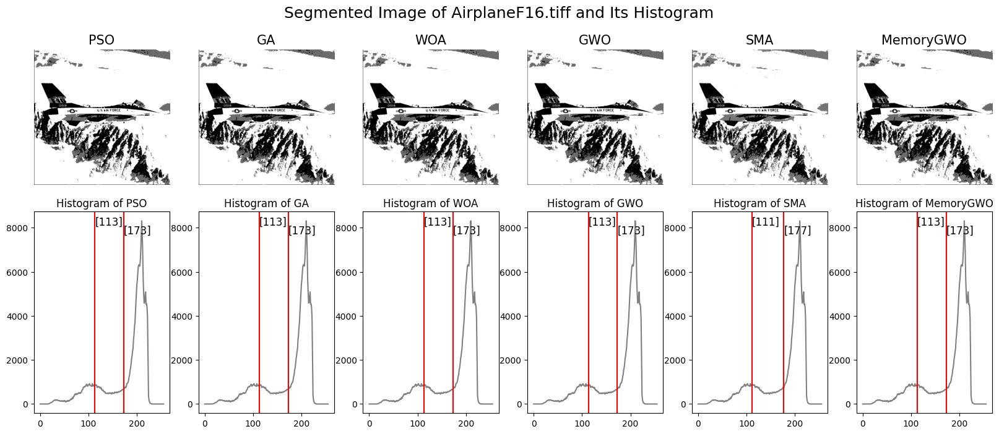

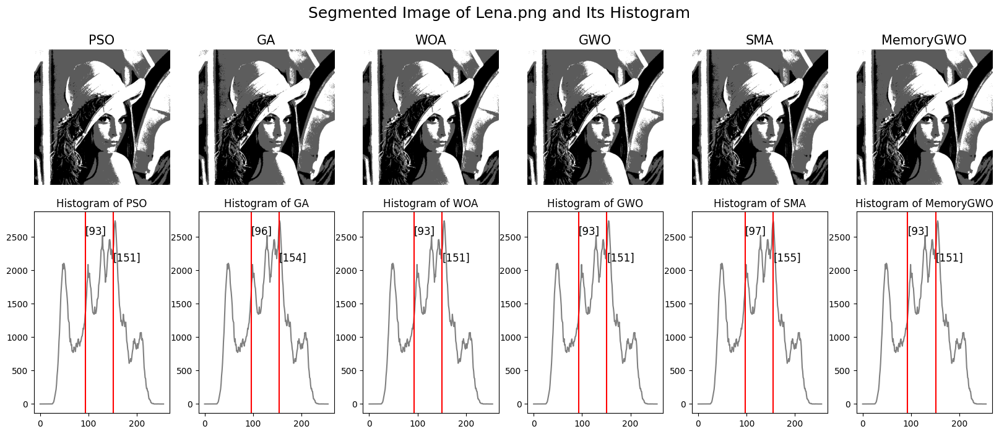

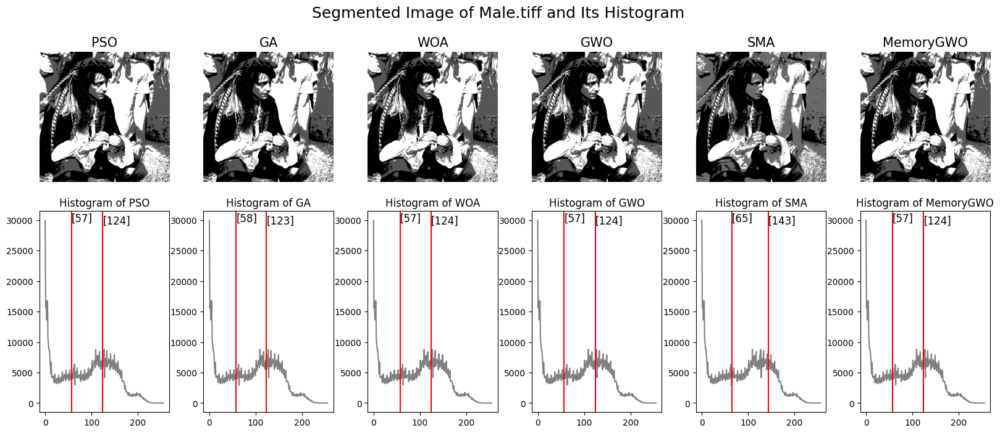

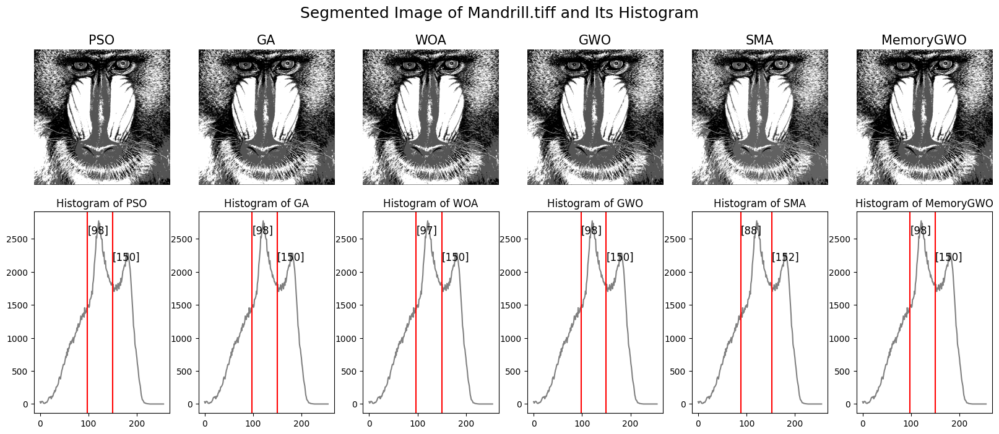

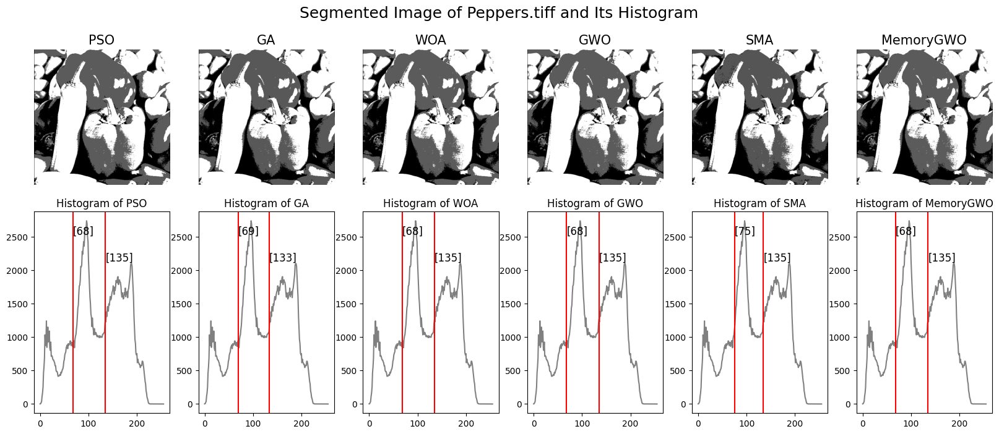

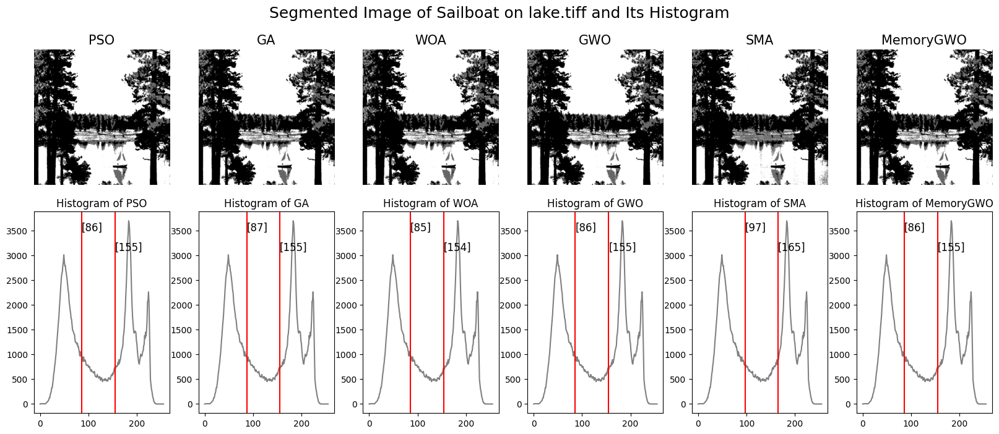

In [22]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, (ax_row1, ax_row2) = plt.subplots(nrows=2, ncols=len(algorithms), figsize=(16, 7))
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo))
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=400
    fig.suptitle('Segmented Image of {} and Its Histogram'.format(image_name), fontsize=18)
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)

## 3-Level

In [29]:
mLevel = 3
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,1,3,"[85, 140, 186]","[94, 146, 192]","[92, 144, 190]","[93, 145, 191]","[78, 134, 180]","[93, 145, 191]"
Lena.png,5,3,"[80, 124, 172]","[81, 127, 171]","[80, 126, 171]","[81, 127, 171]","[60, 120, 169]","[81, 127, 171]"
Male.tiff,9,3,"[40, 96, 145]","[39, 92, 142]","[39, 91, 142]","[39, 92, 142]","[44, 103, 162]","[39, 92, 142]"
Mandrill.tiff,13,3,"[79, 122, 160]","[84, 123, 160]","[70, 119, 159]","[83, 124, 161]","[57, 116, 161]","[86, 125, 161]"
Peppers.tiff,17,3,"[59, 115, 157]","[62, 118, 166]","[60, 116, 165]","[63, 119, 166]","[49, 99, 155]","[61, 117, 165]"
Sailboat on lake.tiff,21,3,"[79, 129, 183]","[79, 141, 195]","[78, 140, 195]","[76, 139, 194]","[59, 123, 178]","[79, 141, 195]"


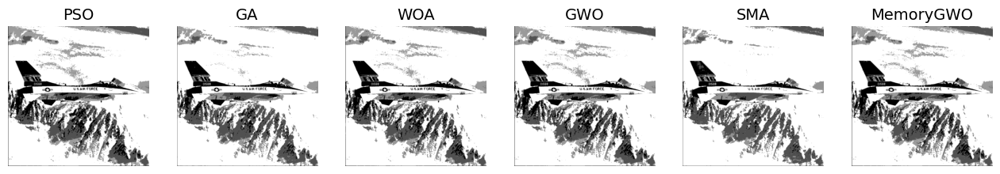

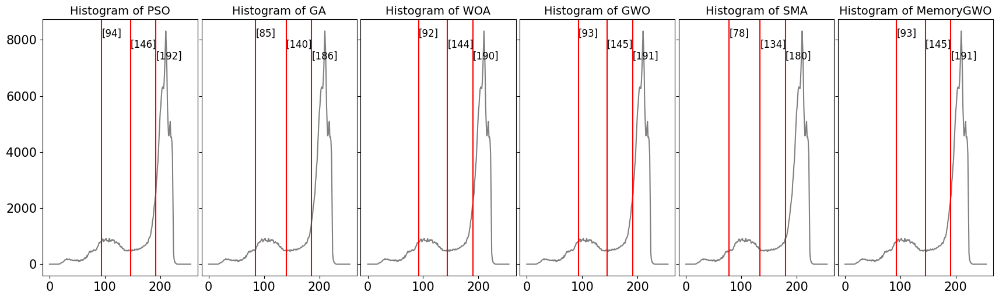

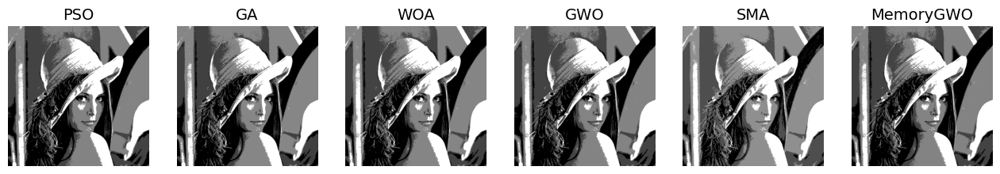

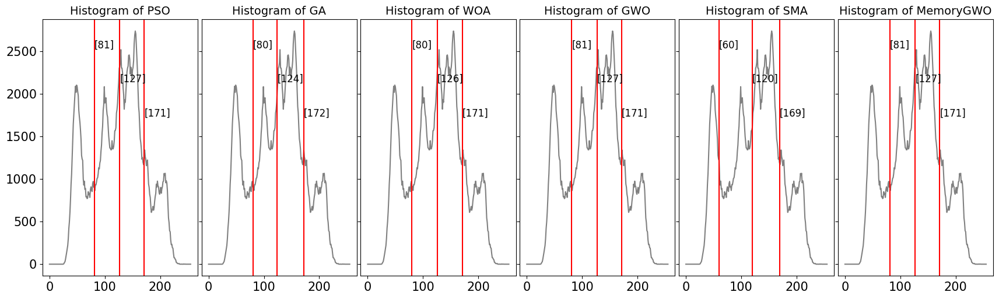

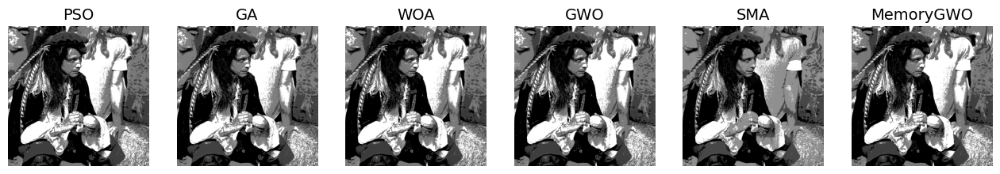

...

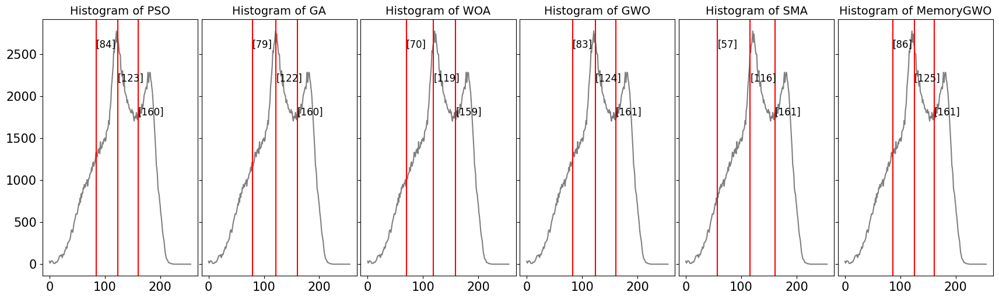

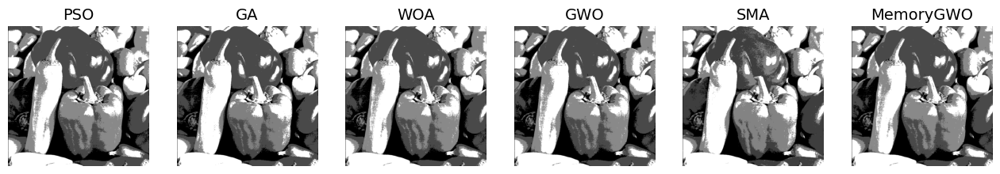

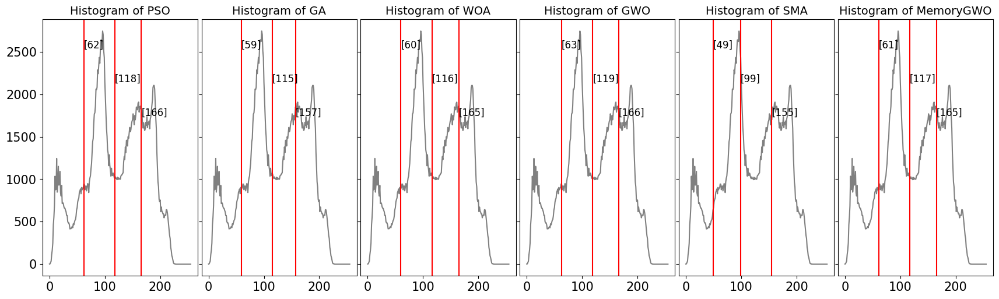

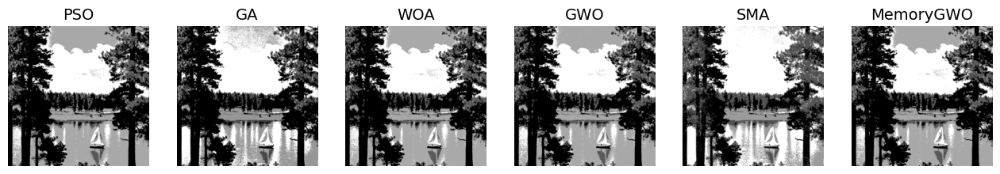

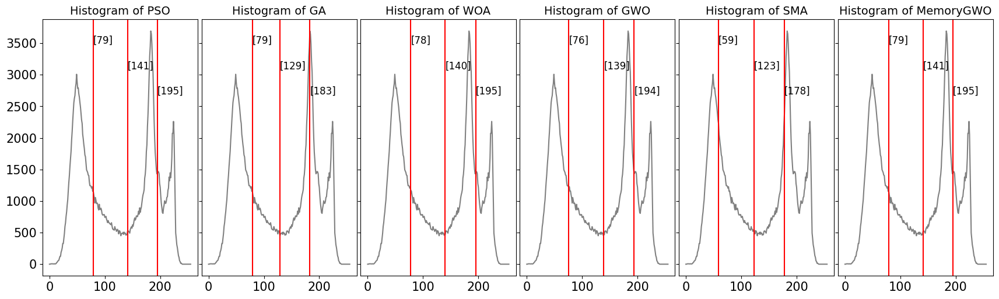

In [34]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16, 7))
#     fig.suptitle('Segmented Image of {} and Its Histogram'.format(image_name), fontsize=18)
    fig, ax_row2 = plt.subplots(
        nrows=1, ncols=len(algorithms), 
        figsize=(17,5), 
        sharey=True
    )
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=14)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo), fontsize=14)
        ax_row2[idx].tick_params(axis='x', labelsize=15)
        ax_row2[idx].tick_params(axis='y', labelsize=15)
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=400
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)

## 4-Level

In [25]:
mLevel = 4
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,2,4,"[74, 115, 152, 188]","[86, 131, 174, 204]","[80, 125, 170, 202]","[84, 128, 172, 203]","[57, 113, 161, 195]","[84, 129, 172, 203]"
Lena.png,6,4,"[69, 107, 142, 179]","[76, 114, 146, 181]","[74, 112, 144, 180]","[75, 114, 145, 180]","[55, 97, 141, 186]","[75, 114, 145, 180]"
Male.tiff,10,4,"[37, 84, 122, 169]","[34, 80, 122, 161]","[29, 75, 119, 160]","[35, 82, 124, 164]","[15, 58, 107, 168]","[35, 82, 124, 164]"
Mandrill.tiff,14,4,"[70, 107, 138, 170]","[66, 104, 136, 167]","[37, 95, 130, 164]","[72, 106, 137, 168]","[46, 100, 142, 179]","[72, 106, 137, 168]"
Peppers.tiff,18,4,"[51, 95, 134, 168]","[44, 84, 125, 169]","[23, 71, 120, 166]","[47, 86, 126, 169]","[32, 90, 137, 178]","[48, 87, 126, 169]"
Sailboat on lake.tiff,22,4,"[61, 107, 151, 194]","[67, 111, 159, 199]","[53, 101, 153, 198]","[67, 110, 158, 199]","[43, 99, 142, 190]","[67, 110, 158, 199]"


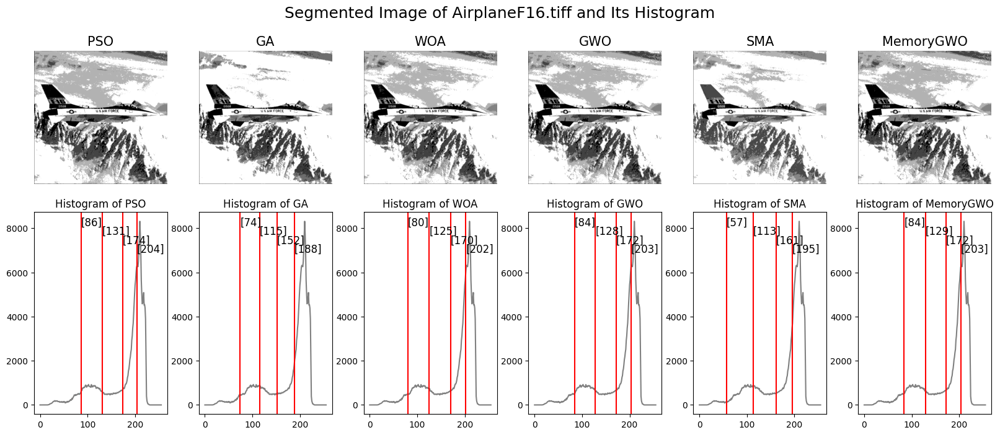

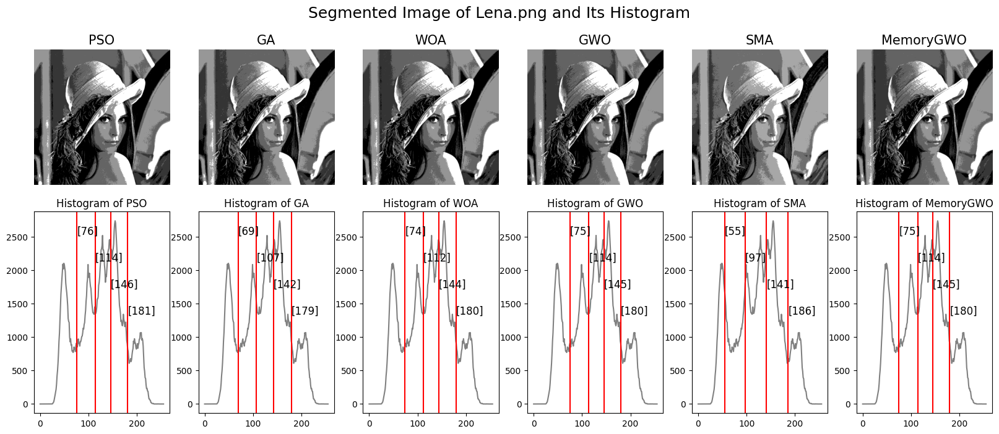

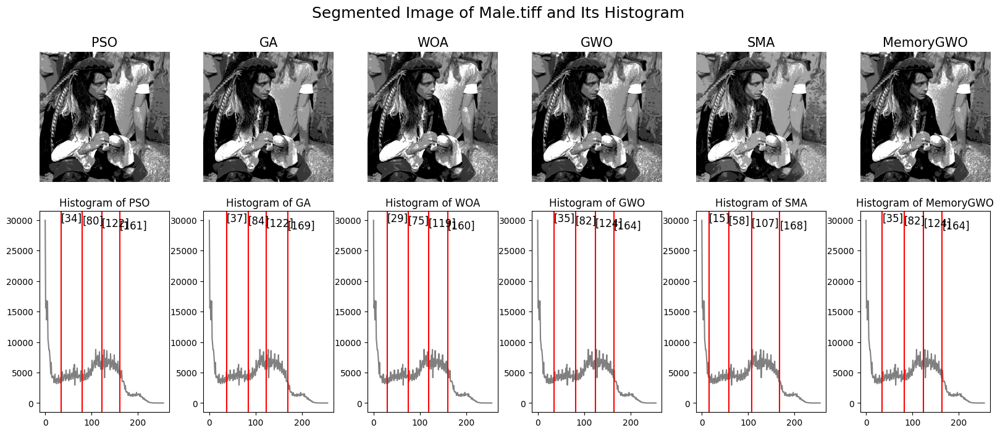

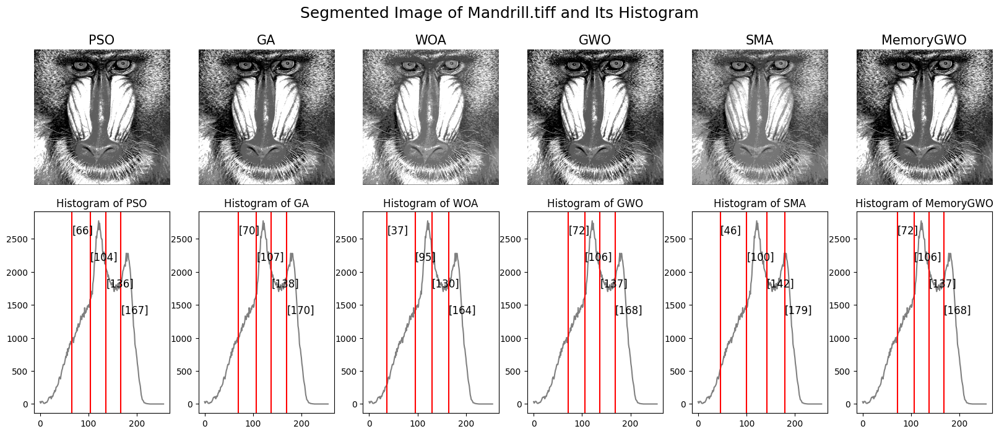

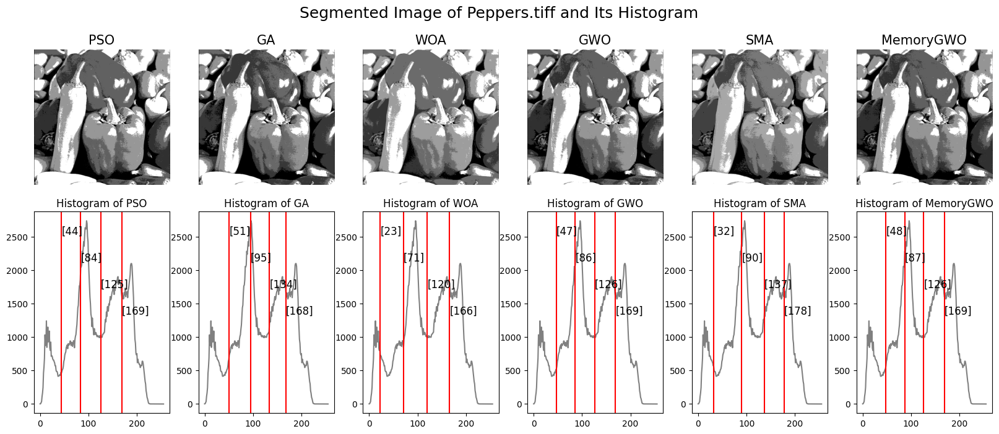

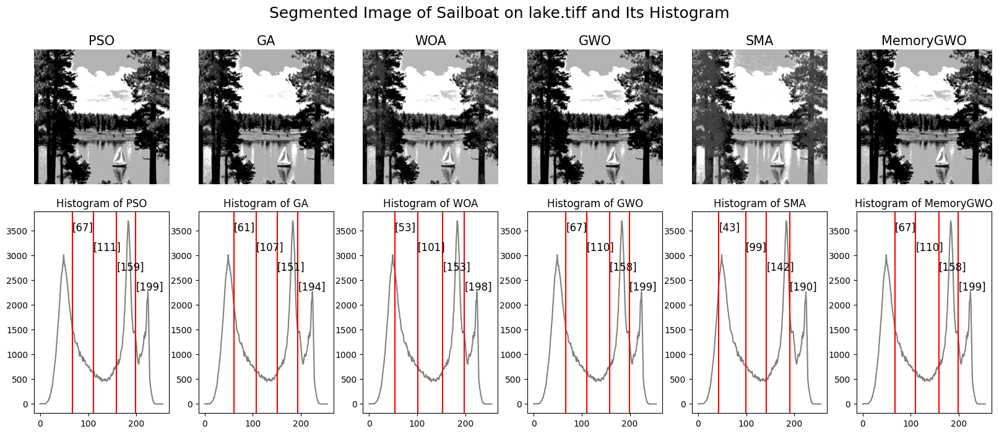

In [26]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, (ax_row1, ax_row2) = plt.subplots(nrows=2, ncols=len(algorithms), figsize=(16, 7))
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo))
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=400
    fig.suptitle('Segmented Image of {} and Its Histogram'.format(image_name), fontsize=18)
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)

## 5-Level

In [27]:
mLevel = 5
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,3,5,"[61, 104, 137, 169, 196]","[73, 110, 146, 181, 205]","[64, 105, 141, 178, 204]","[68, 107, 143, 180, 205]","[36, 90, 132, 171, 202]","[71, 108, 144, 180, 205]"
Lena.png,7,5,"[63, 96, 122, 157, 189]","[73, 110, 136, 161, 190]","[66, 96, 125, 152, 183]","[70, 103, 130, 155, 185]","[38, 75, 122, 158, 199]","[72, 107, 134, 158, 187]"
Male.tiff,11,5,"[31, 73, 108, 142, 183]","[26, 62, 97, 132, 170]","[9, 42, 84, 125, 164]","[28, 65, 100, 134, 172]","[19, 55, 91, 133, 193]","[28, 65, 100, 134, 172]"
Mandrill.tiff,15,5,"[61, 96, 126, 157, 184]","[45, 85, 115, 142, 170]","[24, 64, 100, 135, 167]","[62, 96, 123, 148, 174]","[28, 67, 118, 152, 185]","[66, 98, 124, 149, 175]"
Peppers.tiff,19,5,"[42, 76, 112, 146, 180]","[36, 72, 107, 141, 175]","[17, 52, 93, 133, 172]","[42, 79, 113, 146, 177]","[24, 66, 108, 146, 185]","[43, 79, 113, 146, 177]"
Sailboat on lake.tiff,23,5,"[53, 87, 131, 165, 200]","[59, 90, 130, 168, 201]","[47, 83, 123, 165, 200]","[58, 88, 128, 167, 201]","[26, 77, 128, 171, 205]","[58, 89, 129, 168, 201]"


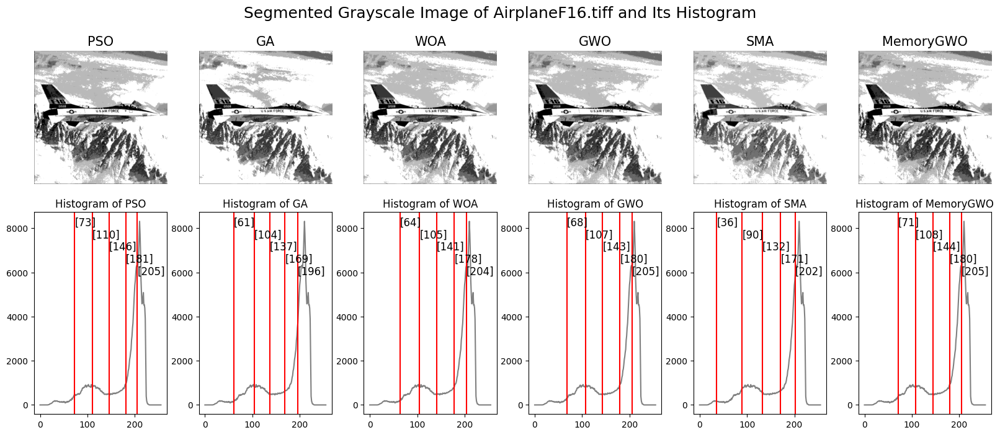

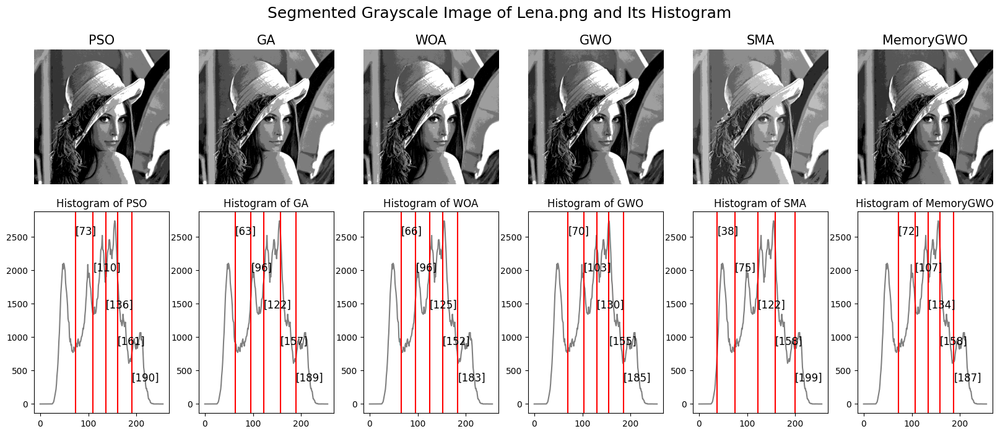

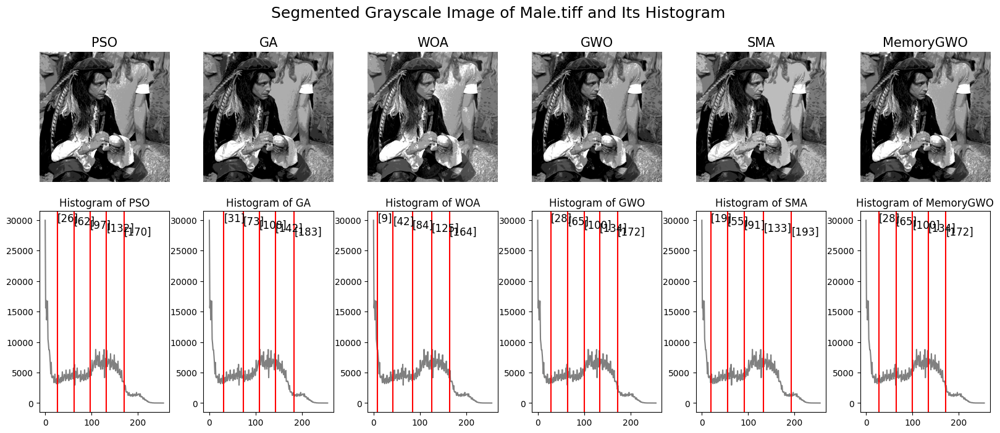

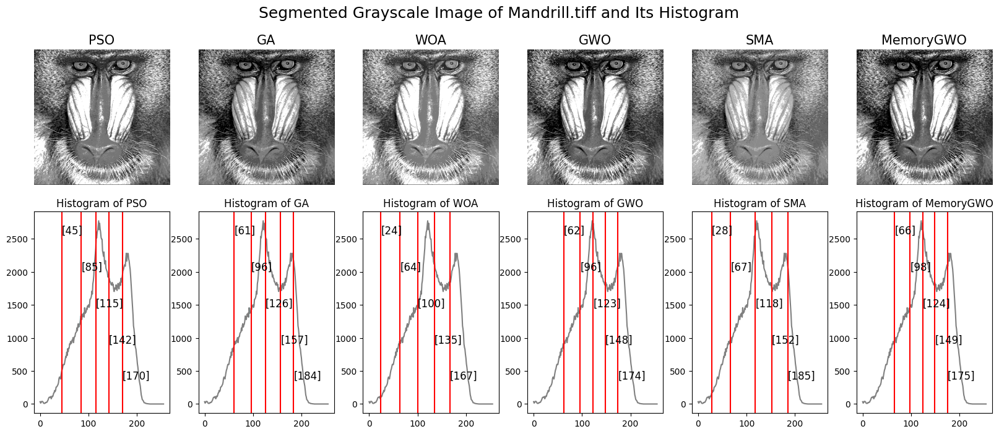

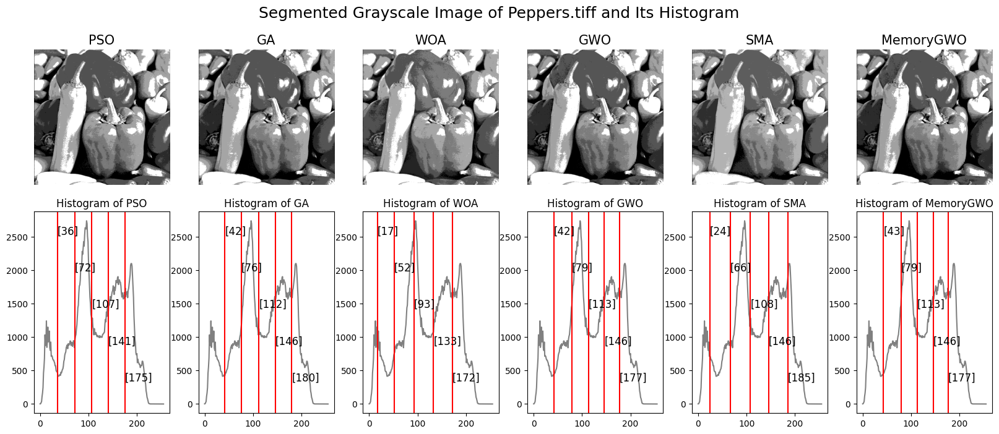

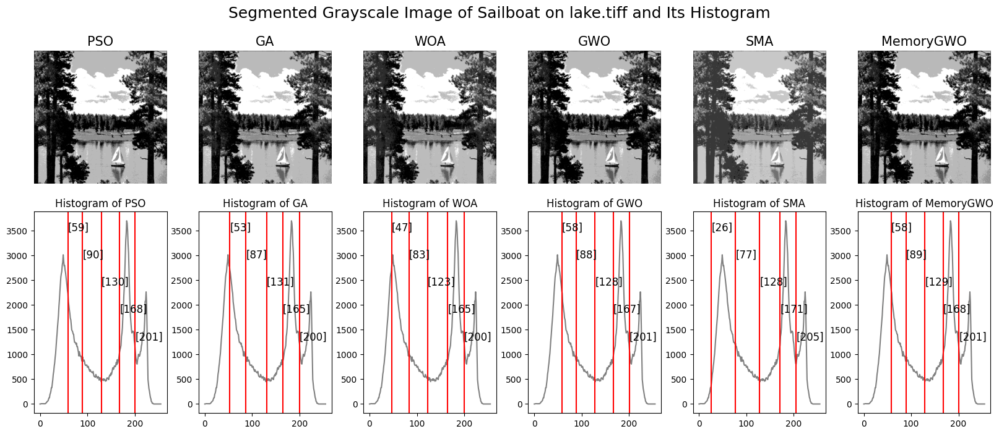

In [28]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, (ax_row1, ax_row2) = plt.subplots(nrows=2, ncols=len(algorithms), figsize=(16, 7))
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo))
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=550
    fig.suptitle('Segmented Grayscale Image of {} and Its Histogram'.format(image_name), fontsize=18)
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)